In [1]:
import pickle
with open('three_layer_graph.pkl', 'rb') as f:
    loaded_object = pickle.load(f)

data_list = loaded_object

In [2]:
import torch
import torch.nn as nn
import sys

In [3]:
EMBEDDING_DIM = 1536

## Try with 20X patches graph and two layer of graph transformmer

In [4]:
sys.path.append('..')
from utils.train_utils import accuracy
from sklearn.metrics import f1_score, roc_auc_score


def train_20x(model, train_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    total_acc = 0
    all_preds = []
    all_labels = []

    for batch in train_loader:
        data_5x = batch[2]
        if data_5x.edge_index.shape[0] < 2:
            continue
        data_5x= data_5x.to(device)
        optimizer.zero_grad()
        output = model(data_5x)
        loss = criterion(output, data_5x.y.long())
        
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        acc = accuracy(output, data_5x.y.long())
        total_acc += acc.item()
        preds = torch.argmax(output, dim=1).cpu().numpy()
        labels = data_5x.y.cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels)

    average_loss = total_loss / len(train_loader)
    average_acc = total_acc / len(train_loader)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    auc = roc_auc_score(all_labels, all_preds)
    return average_loss, average_acc, f1, auc

def valid_20x(model, val_loader, criterion, device):
    model.eval()
    total_loss = 0
    total_acc = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch in val_loader:
            data_5x = batch[2]
            if data_5x[0]['edge_index'].shape[0]<2:
                continue
            data_5x = data_5x.to(device)
            output = model(data_5x)
            loss = criterion(output, data_5x.y.long())
            acc = accuracy(output, data_5x.y.long())
            total_acc += acc.item()
            total_loss += loss.item()

            preds = torch.argmax(output, dim=1).cpu().numpy()
            labels = data_5x.y.cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels)

    average_loss = total_loss / len(val_loader)
    average_acc = total_acc / len(val_loader)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    auc = roc_auc_score(all_labels, all_preds)

    return average_loss, average_acc, f1, auc

/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [5]:
from sklearn.model_selection import train_test_split
from torch_geometric.data import Data, DataLoader

train_dataset, val_dataset = train_test_split(data_list, test_size=0.2, random_state=58)
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


In [6]:
from GNN import SingleResolutionGraphModel
# Free up GPU memory
torch.cuda.empty_cache()

# Instantiate your model and move it to the correct device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = SingleResolutionGraphModel(num_features=EMBEDDING_DIM, latent_dim=8, num_classes=2).to(device)
# Compute class weights and move them to the correct device
all_labels = torch.cat([data[0].y for data in train_loader.dataset]).long()  # Ensure labels are in long format
class_counts = torch.bincount(all_labels)
class_weights = (1.0 / class_counts.float()).to(device)

# Define the criterion with class weights
criterion = nn.CrossEntropyLoss(weight=class_weights)

# Define the optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

# Assume train_dataset and val_dataset are already defined
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

num_epochs = 30
for epoch in range(num_epochs):
    print(f'--Start Epoch {epoch+1}/{num_epochs}--')
    train_loss, train_acc, train_f1, train_auc = train_20x(model, train_loader, optimizer, criterion, device)
    val_loss, val_acc, val_f1, val_auc = valid_20x(model, val_loader, criterion, device)
    print(f'Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, F1: {train_f1:.4f}, AUC: {train_auc:.4f}')
    print(f'Epoch {epoch + 1}/{num_epochs}, Valid Loss: {val_loss:.4f}, Acc: {val_acc:.4f}, F1: {val_f1:.4f}, AUC: {val_auc:.4f}')

--Start Epoch 1/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 1/30, Train Loss: 0.7454, Acc: 0.6212, F1: 0.5290, AUC: 0.4902
Epoch 1/30, Valid Loss: 0.5715, Acc: 0.7800, F1: 0.7011, AUC: 0.4875
--Start Epoch 2/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 2/30, Train Loss: 0.5955, Acc: 0.6616, F1: 0.6243, AUC: 0.5684
Epoch 2/30, Valid Loss: 0.6088, Acc: 0.7400, F1: 0.7573, AUC: 0.6875
--Start Epoch 3/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 3/30, Train Loss: 0.4825, Acc: 0.7424, F1: 0.7352, AUC: 0.6945
Epoch 3/30, Valid Loss: 0.5737, Acc: 0.8200, F1: 0.7953, AUC: 0.6250
--Start Epoch 4/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 4/30, Train Loss: 0.3724, Acc: 0.8586, F1: 0.8590, AUC: 0.8477
Epoch 4/30, Valid Loss: 0.6426, Acc: 0.7600, F1: 0.7600, AUC: 0.6250
--Start Epoch 5/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 5/30, Train Loss: 0.2816, Acc: 0.8788, F1: 0.8784, AUC: 0.8632
Epoch 5/30, Valid Loss: 0.7224, Acc: 0.7200, F1: 0.7291, AUC: 0.6000
--Start Epoch 6/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 6/30, Train Loss: 0.1338, Acc: 0.9545, F1: 0.9545, AUC: 0.9483
Epoch 6/30, Valid Loss: 1.2760, Acc: 0.5800, F1: 0.6215, AUC: 0.6250
--Start Epoch 7/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 7/30, Train Loss: 0.0566, Acc: 0.9848, F1: 0.9848, AUC: 0.9816
Epoch 7/30, Valid Loss: 1.4629, Acc: 0.6200, F1: 0.6580, AUC: 0.6500
--Start Epoch 8/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 8/30, Train Loss: 0.0331, Acc: 0.9848, F1: 0.9848, AUC: 0.9816
Epoch 8/30, Valid Loss: 1.3066, Acc: 0.6800, F1: 0.7079, AUC: 0.6500
--Start Epoch 9/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 9/30, Train Loss: 0.0060, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 9/30, Valid Loss: 1.5237, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 10/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 10/30, Train Loss: 0.0011, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 10/30, Valid Loss: 1.5036, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 11/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 11/30, Train Loss: 0.0006, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 11/30, Valid Loss: 1.5113, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 12/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 12/30, Train Loss: 0.0004, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 12/30, Valid Loss: 1.5337, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 13/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 13/30, Train Loss: 0.0003, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 13/30, Valid Loss: 1.5446, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 14/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 14/30, Train Loss: 0.0003, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 14/30, Valid Loss: 1.5598, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 15/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 15/30, Train Loss: 0.0002, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 15/30, Valid Loss: 1.5716, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 16/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 16/30, Train Loss: 0.0002, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 16/30, Valid Loss: 1.5869, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 17/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 17/30, Train Loss: 0.0002, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 17/30, Valid Loss: 1.6078, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 18/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 18/30, Train Loss: 0.0001, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 18/30, Valid Loss: 1.6223, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 19/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 19/30, Train Loss: 0.0001, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 19/30, Valid Loss: 1.6369, Acc: 0.7400, F1: 0.7612, AUC: 0.7250
--Start Epoch 20/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 20/30, Train Loss: 0.0001, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 20/30, Valid Loss: 1.6474, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 21/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 21/30, Train Loss: 0.0001, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 21/30, Valid Loss: 1.6413, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 22/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 22/30, Train Loss: 0.0001, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 22/30, Valid Loss: 1.6656, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 23/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 23/30, Train Loss: 0.0001, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 23/30, Valid Loss: 1.6816, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 24/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 24/30, Train Loss: 0.0001, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 24/30, Valid Loss: 1.6790, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 25/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 25/30, Train Loss: 0.0001, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 25/30, Valid Loss: 1.7012, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 26/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 26/30, Train Loss: 0.0000, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 26/30, Valid Loss: 1.7101, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 27/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 27/30, Train Loss: 0.0000, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 27/30, Valid Loss: 1.7090, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 28/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 28/30, Train Loss: 0.0000, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 28/30, Valid Loss: 1.7284, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 29/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 29/30, Train Loss: 0.0000, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 29/30, Valid Loss: 1.7254, Acc: 0.7200, F1: 0.7410, AUC: 0.6750
--Start Epoch 30/30--


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 30/30, Train Loss: 0.0000, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 30/30, Valid Loss: 1.7381, Acc: 0.7200, F1: 0.7410, AUC: 0.6750


In [7]:
import pandas as pd
sub_id_list = list(pd.read_hdf('id_list.h5')[0])
embedding_dir = '../patch_embeddings/'
tile_20X_df = pd.read_hdf(embedding_dir+'20Xtile_embeding.h5')

import cv2
import matplotlib.pyplot as plt
import os
image_dir_path='../patch_embeddings/20XTiles/'
# Step 1: Read the image using OpenCV
def show_image_by_path(image_name):
    image_path=None
    # image_path = image_dir_path+'225322/16592x_74177y.jpg'  # Replace with the path to your image
    image_path=image_dir_path+image_name
    if not os.path.exists(image_path):
        print(f"Error: The file at path '{image_path}' does not exist.")
    else:
        # Step 2: Read the image using OpenCV
        image = cv2.imread(image_path)
        
        # Check if the image was loaded correctly
        if image is None:
            print(f"Error: Failed to load the image at path '{image_path}'.")
        else:
            # Convert the image from BGR (OpenCV format) to RGB (Matplotlib format)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            # Step 3: Display the image using Matplotlib
            plt.figure(figsize=(8, 6))
            plt.imshow(image_rgb)
            plt.title('Image Display')
            plt.axis('off')  # Hide axis
            plt.show()

Top 10 Important Edges: [1979  614  423 1635  613  543  544 1357 1363 1143]
9272 18544


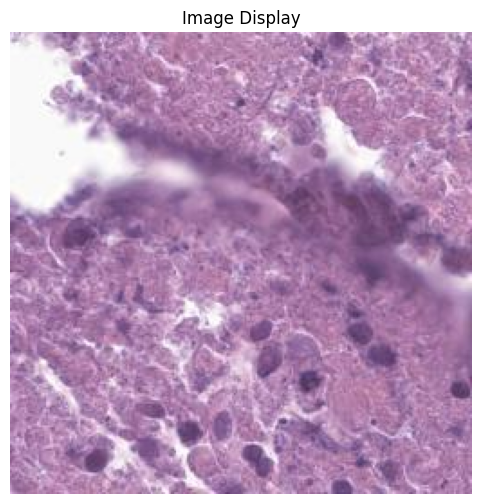

8784 18056


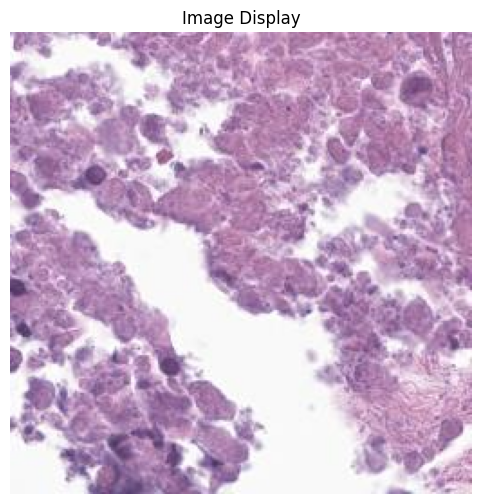

11224 31720


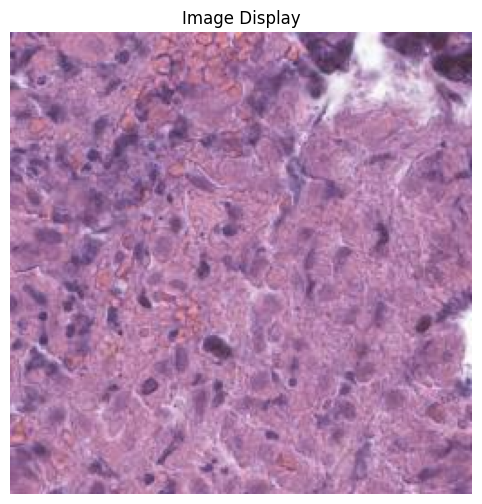

11224 31232


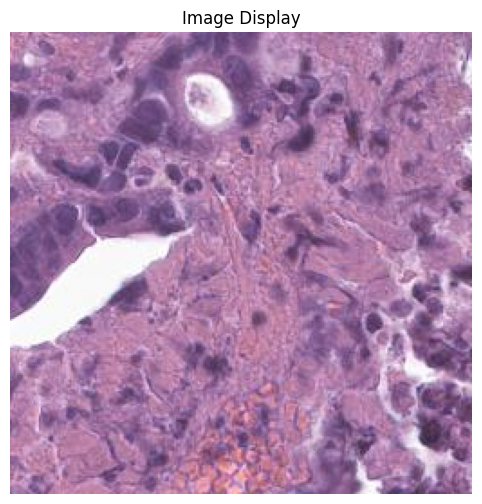

10248 31720


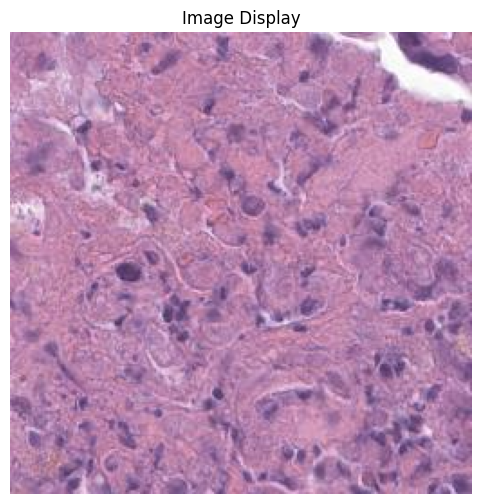

9760 31232


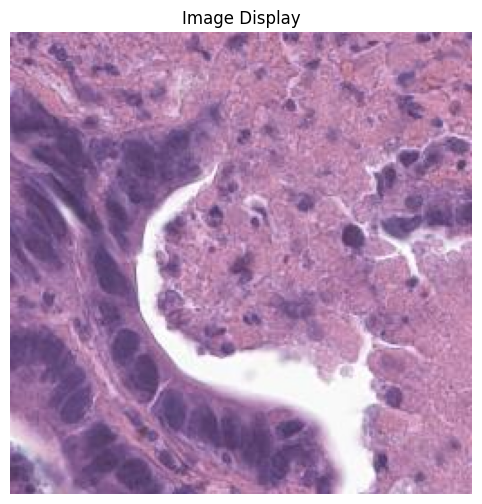

11224 32208


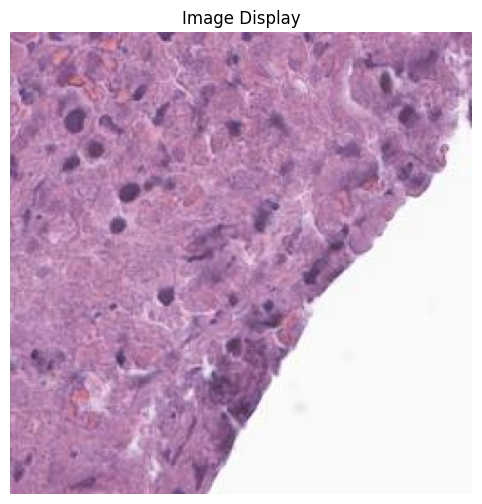

11224 31720


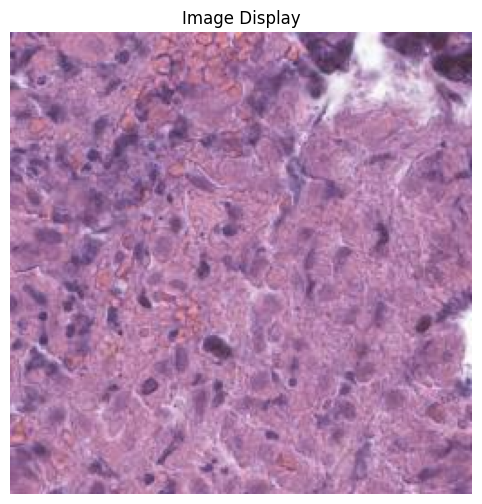

11224 31720


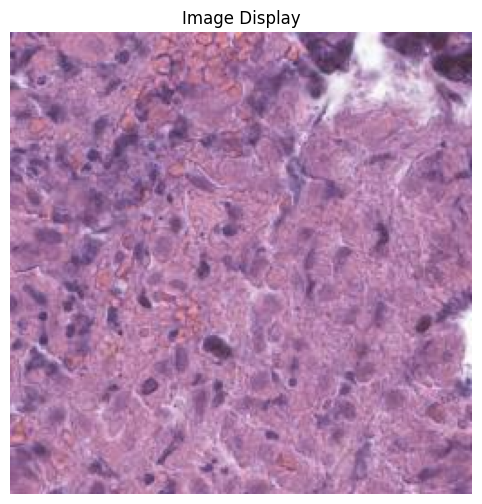

10736 31232


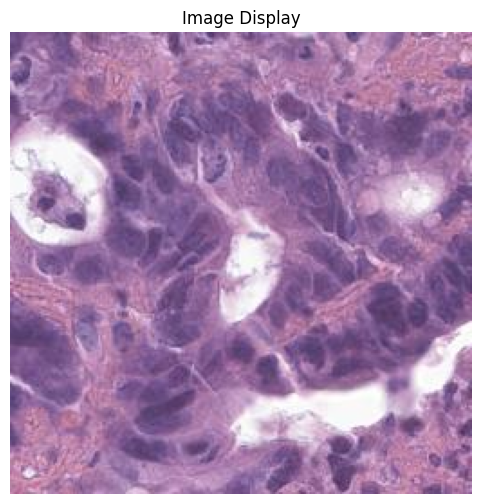

10736 29768


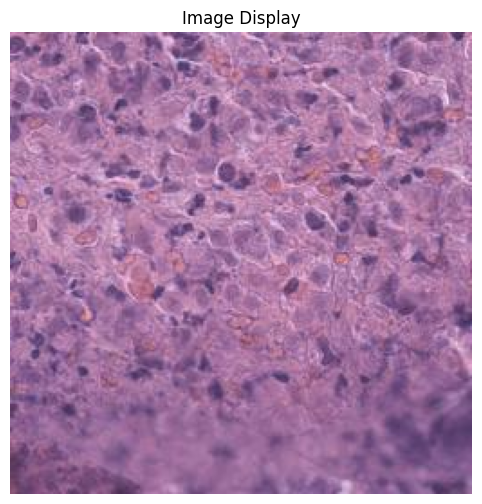

11224 29768


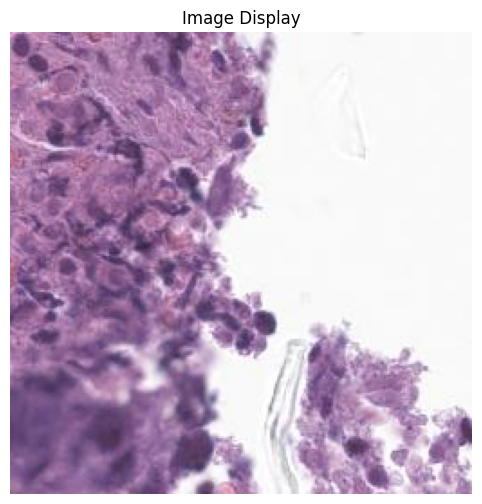

10736 29768


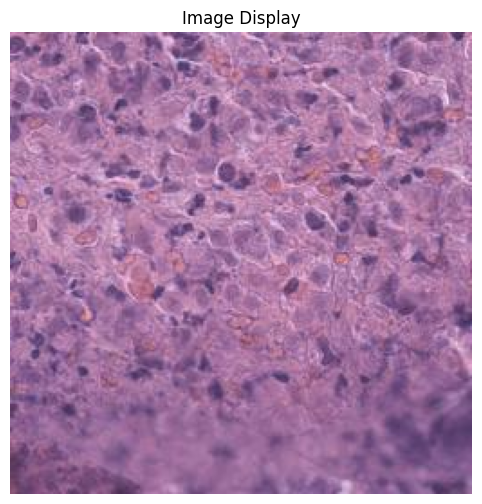

11224 29280


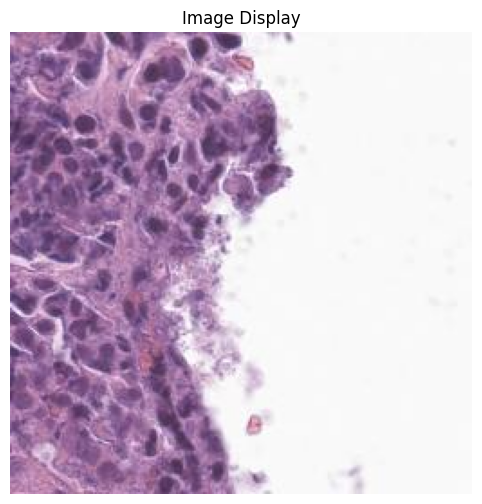

10248 29280


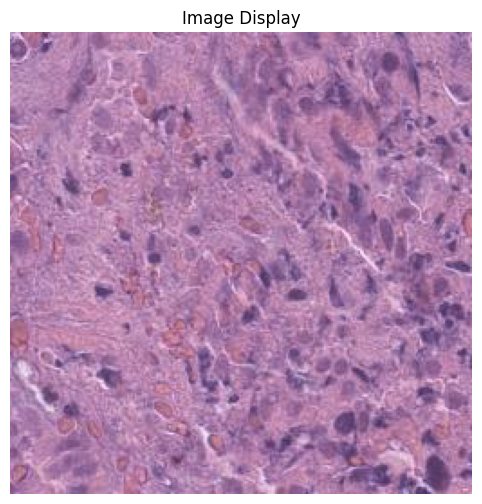

10736 28792


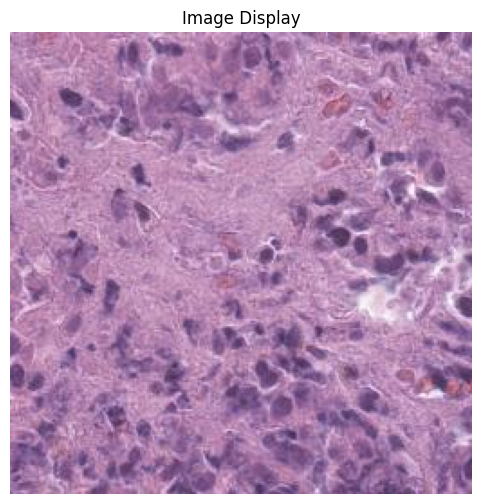

10248 29280


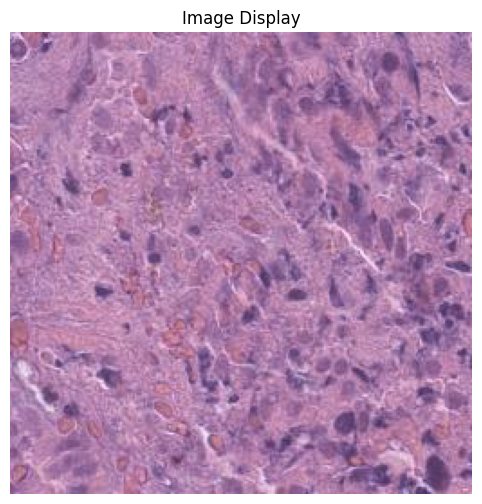

10248 28792


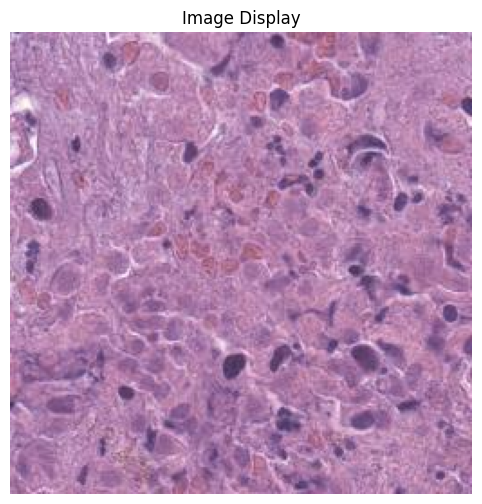

9760 46849


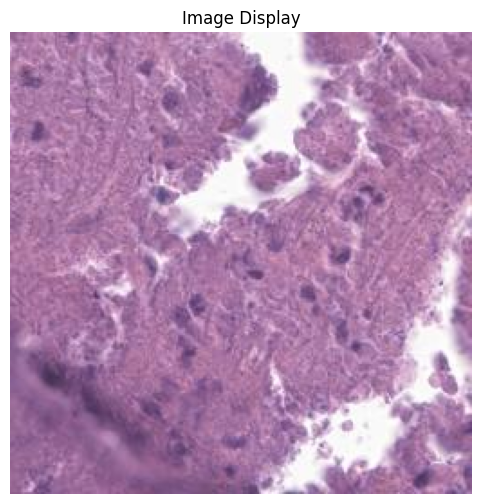

9272 46361


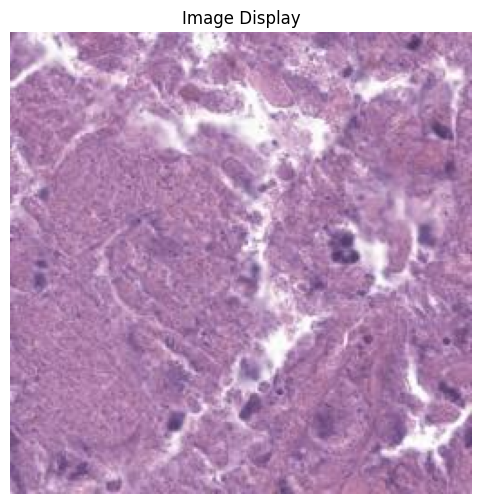

In [8]:
data_list
index = 1
data_explain = data_list[index]
for batch in [data_explain]:
    data_20x = batch[2]
    if data_20x['edge_index'].shape[0]<2:
        continue
    data_20x = data_20x.to(device)
    output, attn = model(data_20x, True)
    preds = torch.argmax(output, dim=1).cpu().numpy()
    labels = data_20x.y.cpu().numpy()
    
    edge_importance = (attn[1]**2).sum(dim=1).cpu().detach().numpy()  # Sum of squares along the last dimension
    top10_indices = torch.topk(torch.tensor(edge_importance), 10).indices.numpy()

    # print("Edge Importance:", edge_importance)
    print("Top 10 Important Edges:", top10_indices)
    id = sub_id_list[index]
    id_df = tile_20X_df[tile_20X_df['ids']==id]
    for ind in top10_indices:
        x = int(data_20x.edge_index[0][ind].cpu())
        y = int(data_20x.edge_index[1][ind].cpu())
        coordx_1 = int(list(id_df.coord1)[int(x)])
        coordx_2 = int(list(id_df.coord2)[int(x)])
        image_name = str(id)+'/'+str(coordx_1)+'x_'+str(coordx_2)+'y.jpg'
        print(coordx_1, coordx_2)
        show_image_by_path(image_name)

        coordy_1 = int(list(id_df.coord1)[int(y)])
        coordy_2 = int(list(id_df.coord2)[int(y)])
        image_name = str(id)+'/'+str(coordy_1)+'x_'+str(coordy_2)+'y.jpg'
        print(coordy_1, coordy_2)
        show_image_by_path(image_name)

Top 10 Important Edges: [1979  614  423 1635  613  543  544 1357 1363 1143]
9272 18544


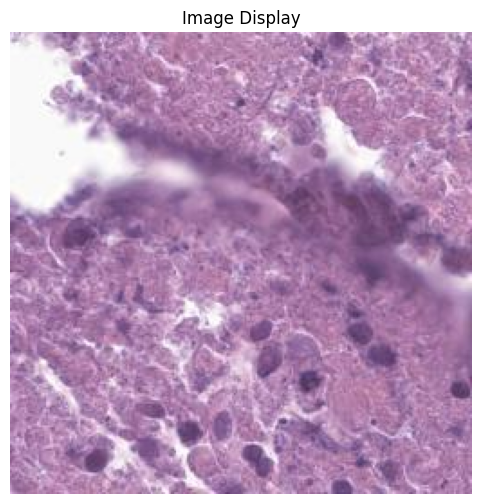

8784 18056


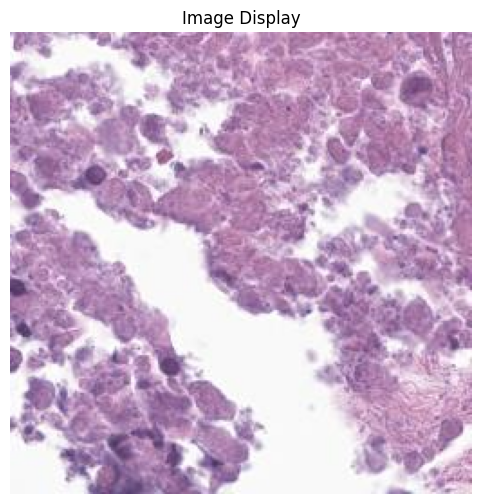

11224 31720


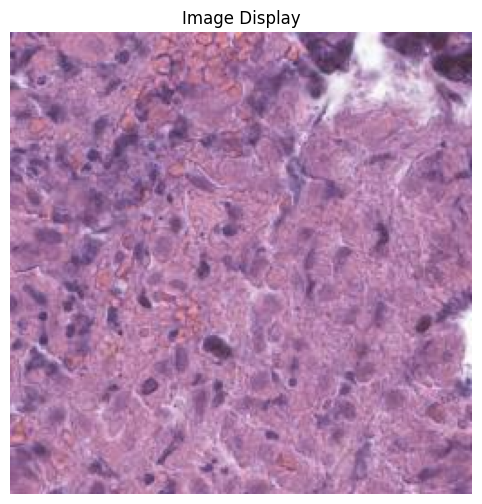

11224 31232


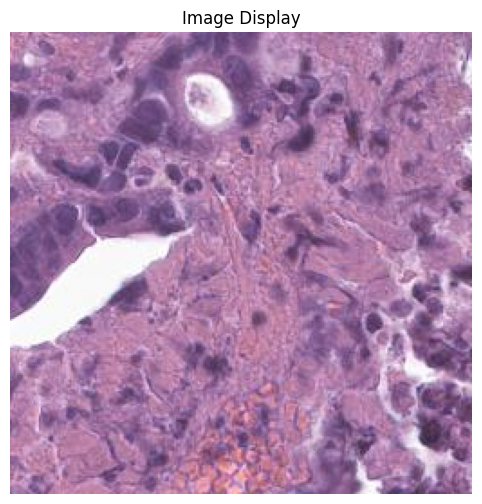

10248 31720


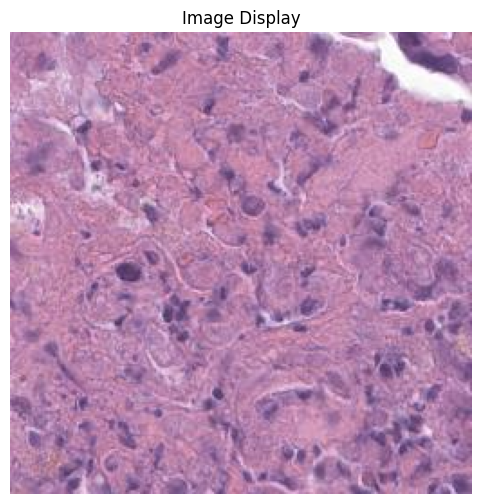

9760 31232


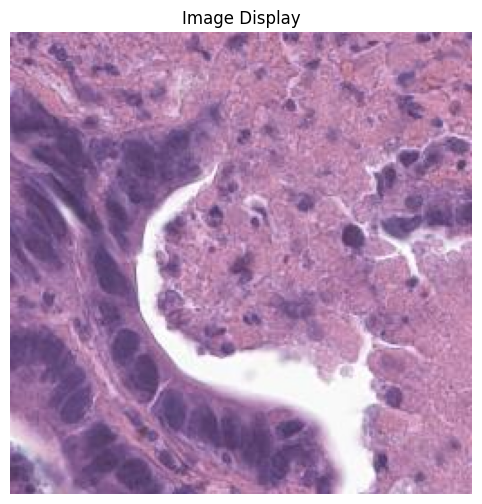

11224 32208


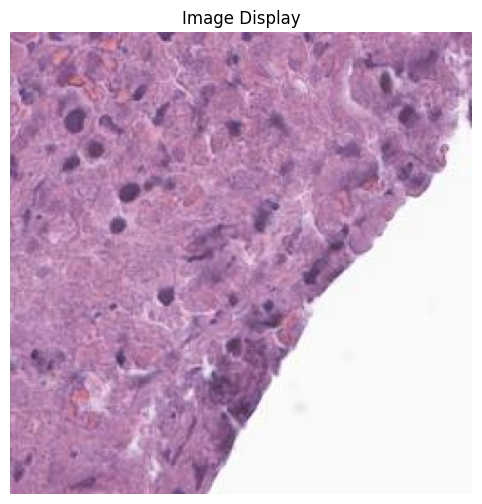

11224 31720


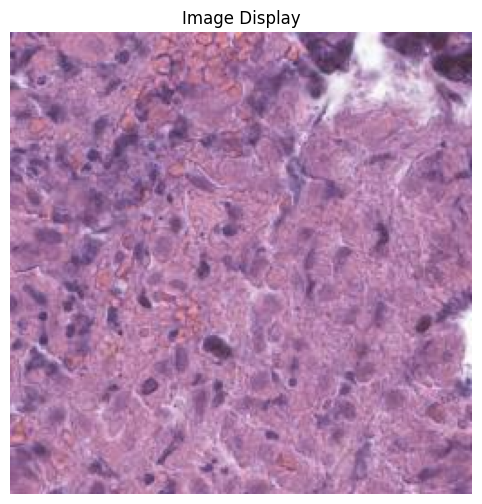

11224 31720


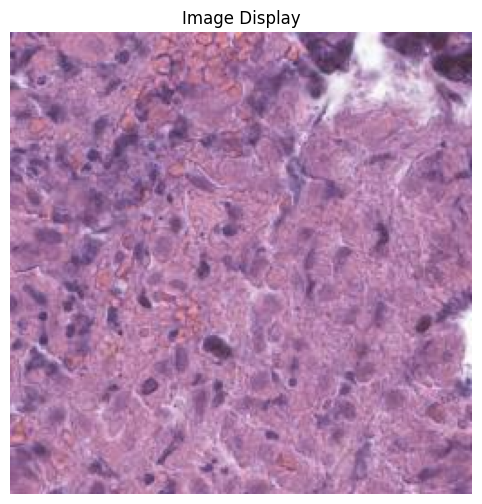

10736 31232


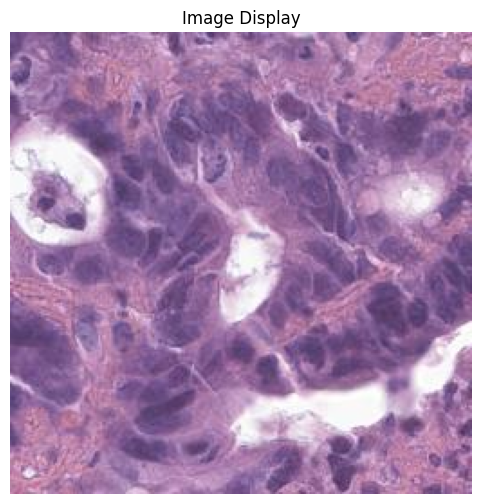

10736 29768


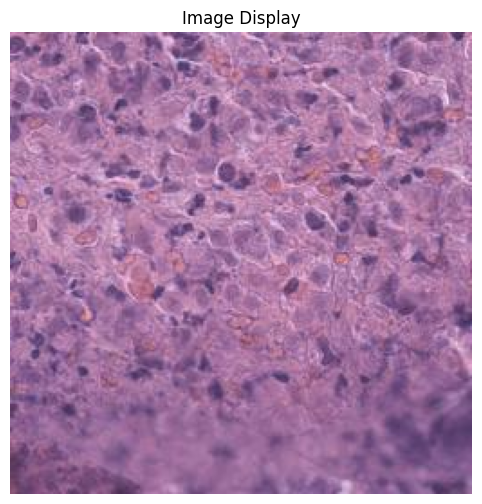

11224 29768


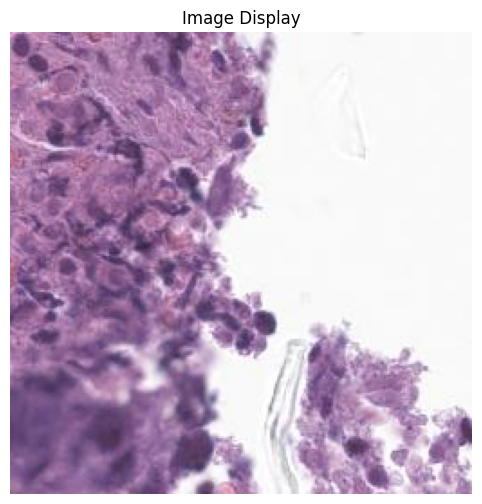

10736 29768


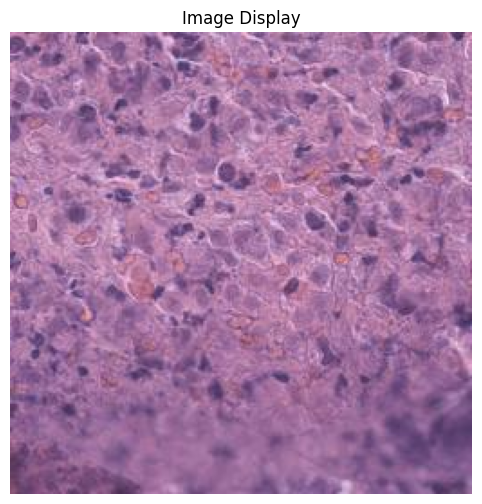

11224 29280


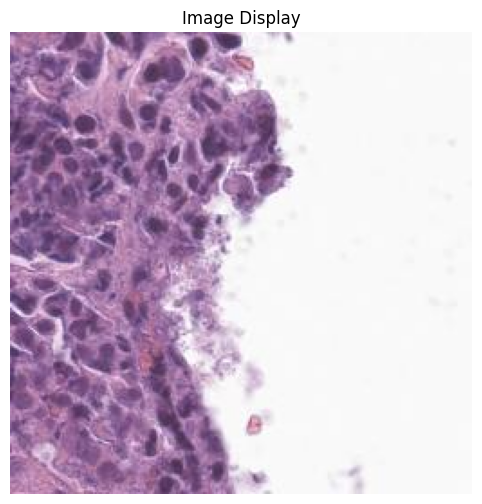

10248 29280


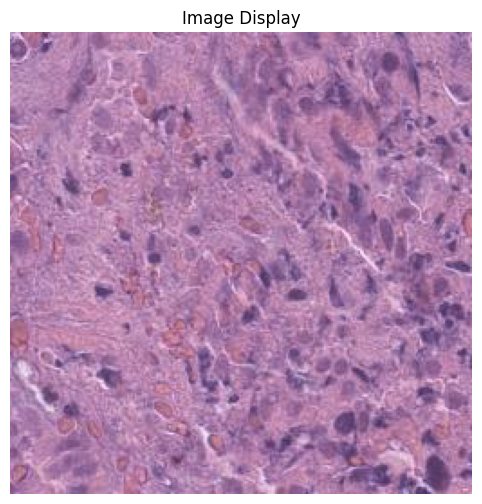

10736 28792


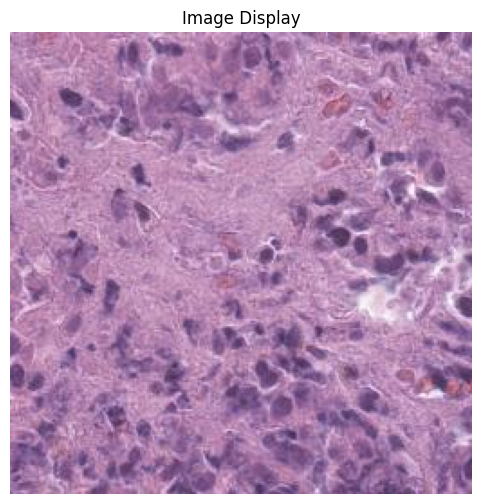

10248 29280


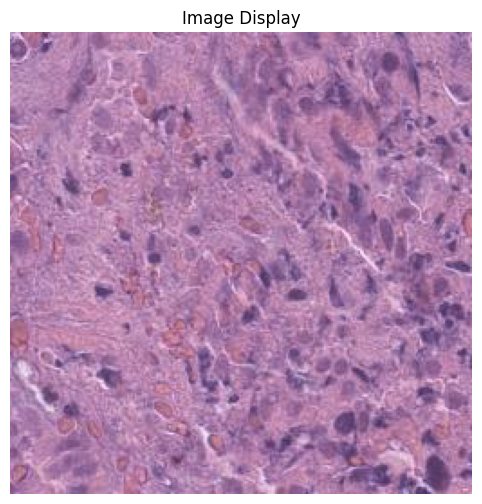

10248 28792


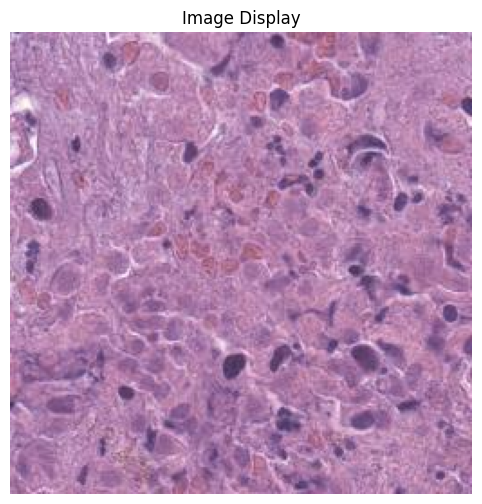

9760 46849


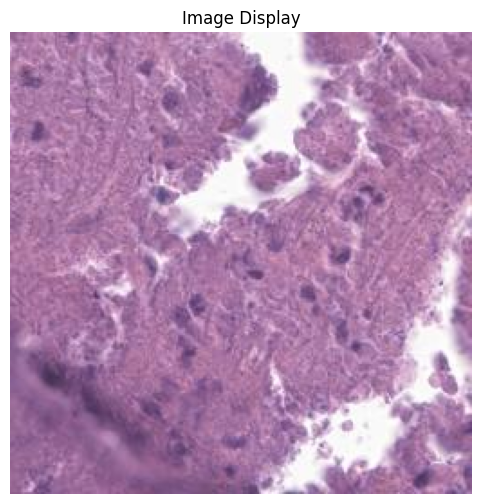

9272 46361


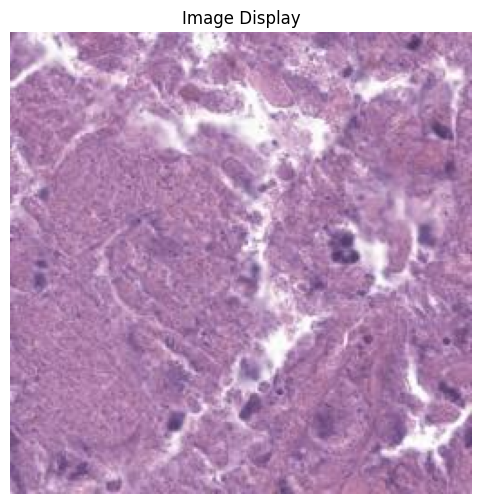

In [9]:
print("Top 10 Important Edges:", top10_indices)

for ind in top10_indices:
    x = int(data_20x.edge_index[0][ind].cpu())
    y = int(data_20x.edge_index[1][ind].cpu())
    coordx_1 = int(list(id_df.coord1)[int(x)])
    coordx_2 = int(list(id_df.coord2)[int(x)])
    image_name = str(id)+'/'+str(coordx_1)+'x_'+str(coordx_2)+'y.jpg'
    print(coordx_1, coordx_2)
    show_image_by_path(image_name)

    coordy_1 = int(list(id_df.coord1)[int(y)])
    coordy_2 = int(list(id_df.coord2)[int(y)])
    image_name = str(id)+'/'+str(coordy_1)+'x_'+str(coordy_2)+'y.jpg'
    print(coordy_1, coordy_2)
    show_image_by_path(image_name)


In [10]:
import torch
from torch_geometric.nn import TransformerConv, global_max_pool
import torch.nn.functional as F
from torch_geometric.data import Data

# class SingleResolutionGraphModel(torch.nn.Module):
#     def __init__(self, num_features, latent_dim, num_classes):
#         super(SingleResolutionGraphModel, self).__init__()
#         hidden_dim = 128
#         heads_num = 8
#         self.conv_5x = nn.Sequential(
#             TransformerConv(in_channels=num_features, out_channels=hidden_dim, heads=heads_num, concat=True),
#             TransformerConv(in_channels=hidden_dim*heads_num, out_channels=latent_dim, heads=heads_num, concat=True)
#             # CustomTransformerConv(num_features, latent_dim, heads=8, concat=True),
#             # CustomTransformerConv(latent_dim * 8, latent_dim, heads=8, concat=True)
#         )
#         self.fc = torch.nn.Sequential(
#             torch.nn.Linear(latent_dim * 8, latent_dim // 2),
#             torch.nn.ReLU(),
#             torch.nn.Linear(latent_dim // 2, num_classes)
#         )
#         self.softmax = torch.nn.Softmax(dim=1)

#     def forward(self, data, return_attn=True):
#         x, edge_index, batch = data.x, data.edge_index, data.batch
#         x = self.conv_5x[0](x, edge_index)
#         x = F.relu(x)
#         x, attn = self.conv_5x[1](x, edge_index, return_attention_weights=return_attn)
#         x = F.relu(x)
#         x = global_max_pool(x, batch)
#         x = self.fc(x)
#         if attn:
#             return (x, attn)
#         return x

# Example usage
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# model = SingleResolutionGraphModel(5, 128, 2).to(device)
# model.eval()

# data = Data(x=torch.randn(10, 5), edge_index=torch.tensor([[0, 1, 1, 2], [1, 0, 2, 3]], dtype=torch.long))
# data = data.to(device)

# # Forward pass
# output, att = model(data, True)
# print("Output:", att)


### Cross Validation

In [11]:
from torch.utils.data import Subset
from sklearn.model_selection import KFold
import numpy as np

from GNN import SingleResolutionGraphModel

# Define your training and validation functions as before
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    correct = (preds == labels).float()
    return correct.sum() / len(correct)

def train_20x(model, train_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    total_acc = 0
    all_preds = []
    all_labels = []

    for batch in train_loader:
        data_5x = batch[2]
        if data_5x.edge_index.shape[0] < 2:
            continue
        data_5x = data_5x.to(device)
        optimizer.zero_grad()
        output = model(data_5x)
        loss = criterion(output, data_5x.y.long())
        
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        acc = accuracy(output, data_5x.y.long())
        total_acc += acc.item()
        preds = torch.argmax(output, dim=1).cpu().numpy()
        labels = data_5x.y.cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels)

    average_loss = total_loss / len(train_loader)
    average_acc = total_acc / len(train_loader)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    auc = roc_auc_score(all_labels, all_preds)
    return average_loss, average_acc, f1, auc

def valid_20x(model, val_loader, criterion, device):
    model.eval()
    total_loss = 0
    total_acc = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch in val_loader:
            data_5x = batch[2]
            if data_5x.edge_index.shape[0] < 2:
                continue
            data_5x = data_5x.to(device)
            output = model(data_5x)
            loss = criterion(output, data_5x.y.long())
            acc = accuracy(output, data_5x.y.long())
            total_acc += acc.item()
            total_loss += loss.item()

            preds = torch.argmax(output, dim=1).cpu().numpy()
            labels = data_5x.y.cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels)

    average_loss = total_loss / len(val_loader)
    average_acc = total_acc / len(val_loader)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    auc = roc_auc_score(all_labels, all_preds)

    return average_loss, average_acc, f1, auc

def cross_validation_and_sensitivity_analysis(dataset, num_features, latent_dim, num_classes, num_folds=5, num_epochs=50, learning_rates=[0.001], weight_decays=[1e-5]):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

    results = []

    for lr in learning_rates:
        for wd in weight_decays:
            fold_results = []
            for fold, (train_idx, val_idx) in enumerate(kf.split(dataset)):
                train_subset = Subset(dataset, train_idx)
                val_subset = Subset(dataset, val_idx)
                train_loader = DataLoader(train_subset, batch_size=1, shuffle=True)
                val_loader = DataLoader(val_subset, batch_size=1, shuffle=False)

                model = SingleResolutionGraphModel(num_features=num_features, latent_dim=latent_dim, num_classes=num_classes).to(device)

                # Compute class weights for the current fold
                all_labels = torch.cat([data[0].y for data in train_loader.dataset]).long()
                class_counts = torch.bincount(all_labels)
                class_weights = (1.0 / class_counts.float()).to(device)
                criterion = nn.CrossEntropyLoss(weight=class_weights)
                
                optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
                single_fold_res = []
                for epoch in range(num_epochs):
                    if epoch % 10 == 0:
                        print(f'Start Epoch {epoch+1}/{num_epochs}, Fold {fold+1}/{num_folds}, LR: {lr}, WD: {wd}')
                    train_loss, train_acc, train_f1, train_auc = train_20x(model, train_loader, optimizer, criterion, device)
                    val_loss, val_acc, val_f1, val_auc = valid_20x(model, val_loader, criterion, device)
                    if epoch % 10 == 0:
                        print(f'Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, F1: {train_f1:.4f}, AUC: {train_auc:.4f}')
                        print(f'Epoch {epoch + 1}/{num_epochs}, Valid Loss: {val_loss:.4f}, Acc: {val_acc:.4f}, F1: {val_f1:.4f}, AUC: {val_auc:.4f}')
                    single_fold_res.append((train_loss, train_acc, train_f1, train_auc, val_loss, val_acc, val_f1, val_auc))
                    fold_results.append((train_loss, train_acc, train_f1, train_auc, val_loss, val_acc, val_f1, val_auc))
                print('----', lr, wd, fold, single_fold_res[-1])
            avg_fold_results = np.mean(fold_results, axis=0)
            print(lr, wd, avg_fold_results)
            results.append((lr, wd, avg_fold_results))

    return results

In [12]:
dataset = data_list 
num_features = 1536
latent_dim = 8
num_classes = 2
learning_rates = [0.001]
# learning_rates = [0.001, 0.0001]
# weight_decays = [1e-5, 1e-4]
weight_decays = [1e-4]

num_folds = 5
num_epochs = 30
torch.cuda.empty_cache()

results = cross_validation_and_sensitivity_analysis(dataset, num_features, latent_dim, num_classes, num_folds, num_epochs, learning_rates, weight_decays)

for lr, wd, metrics in results:
    print(f"LR: {lr}, WD: {wd}, Metrics: {metrics}")

Start Epoch 1/30, Fold 1/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 1/30, Train Loss: 0.6844, Acc: 0.6768, F1: 0.5749, AUC: 0.4869
Epoch 1/30, Valid Loss: 0.6293, Acc: 0.6400, F1: 0.5579, AUC: 0.5583


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Start Epoch 11/30, Fold 1/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 11/30, Train Loss: 0.0006, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 11/30, Valid Loss: 1.5512, Acc: 0.7200, F1: 0.7015, AUC: 0.6750


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

Start Epoch 21/30, Fold 1/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 21/30, Train Loss: 0.0002, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 21/30, Valid Loss: 1.5493, Acc: 0.7000, F1: 0.6839, AUC: 0.6583


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

---- 0.001 0.0001 0 (0.00027591910251040523, 1.0, 1.0, 1.0, 2.5287009215288463, 0.68, 0.6241164241164241, 0.6083333333333333)
Start Epoch 1/30, Fold 2/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 1/30, Train Loss: 0.6780, Acc: 0.6162, F1: 0.5925, AUC: 0.5265
Epoch 1/30, Valid Loss: 0.5824, Acc: 0.6400, F1: 0.5995, AUC: 0.4574


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

Start Epoch 11/30, Fold 2/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 11/30, Train Loss: 0.0013, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 11/30, Valid Loss: 1.4477, Acc: 0.6000, F1: 0.5886, AUC: 0.4553


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

Start Epoch 21/30, Fold 2/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 21/30, Train Loss: 0.0003, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 21/30, Valid Loss: 1.4985, Acc: 0.6000, F1: 0.5886, AUC: 0.4553


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

---- 0.001 0.0001 1 (0.0002792310482347477, 1.0, 1.0, 1.0, 1.5149789702500447, 0.6, 0.6, 0.4802494802494803)
Start Epoch 1/30, Fold 3/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 1/30, Train Loss: 0.6531, Acc: 0.6818, F1: 0.5528, AUC: 0.5000
Epoch 1/30, Valid Loss: 0.6652, Acc: 0.6800, F1: 0.5505, AUC: 0.5000


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

Start Epoch 11/30, Fold 3/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 11/30, Train Loss: 0.0008, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 11/30, Valid Loss: 2.1534, Acc: 0.6000, F1: 0.6057, AUC: 0.5570


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

Start Epoch 21/30, Fold 3/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 21/30, Train Loss: 0.0003, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 21/30, Valid Loss: 2.2849, Acc: 0.6000, F1: 0.6057, AUC: 0.5570


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

---- 0.001 0.0001 2 (0.6732544332696723, 0.7777777777777778, 0.7564717162032598, 0.6846560846560846, 0.8235483115538955, 0.58, 0.5671491015055853, 0.49264705882352944)
Start Epoch 1/30, Fold 4/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 1/30, Train Loss: 0.6757, Acc: 0.6583, F1: 0.5724, AUC: 0.4987
Epoch 1/30, Valid Loss: 0.6988, Acc: 0.6735, F1: 0.5421, AUC: 0.5000


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

Start Epoch 11/30, Fold 4/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 11/30, Train Loss: 0.0014, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 11/30, Valid Loss: 1.7929, Acc: 0.5714, F1: 0.5796, AUC: 0.5369


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

Start Epoch 21/30, Fold 4/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 21/30, Train Loss: 0.0002, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 21/30, Valid Loss: 2.1350, Acc: 0.5714, F1: 0.5796, AUC: 0.5369


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

---- 0.001 0.0001 3 (0.3813946718528491, 0.8190954773869347, 0.7978245088825989, 0.7228057889822596, 0.6663145165522499, 0.6530612244897959, 0.6059982253771073, 0.5331439393939393)
Start Epoch 1/30, Fold 5/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 1/30, Train Loss: 0.7240, Acc: 0.6683, F1: 0.6018, AUC: 0.5319
Epoch 1/30, Valid Loss: 0.6200, Acc: 0.7143, F1: 0.5952, AUC: 0.5000


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

Start Epoch 11/30, Fold 5/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 11/30, Train Loss: 0.0144, Acc: 0.9950, F1: 0.9950, AUC: 0.9963
Epoch 11/30, Valid Loss: 0.6981, Acc: 0.6735, F1: 0.6796, AUC: 0.6214


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

Start Epoch 21/30, Fold 5/5, LR: 0.001, WD: 0.0001


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)


Epoch 21/30, Train Loss: 0.0037, Acc: 1.0000, F1: 1.0000, AUC: 1.0000
Epoch 21/30, Valid Loss: 0.8293, Acc: 0.7347, F1: 0.7373, AUC: 0.6857


/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anaconda3/envs/gigapath/lib/python3.9/site-packages/torch_geometric/warnings.py:11: UserWarning: The usage of `scatter(reduce='max')` can be accelerated via the 'torch-scatter' package, but it was not found
  warnings.warn(message)
/home/lizx43/anacond

---- 0.001 0.0001 4 (0.0030266125618151757, 1.0, 1.0, 1.0, 0.8961135924582774, 0.7142857142857143, 0.7234848484848485, 0.6928571428571428)
0.001 0.0001 [0.10871282 0.95153647 0.94435209 0.93309003 1.43805278 0.64008707
 0.62597225 0.57092701]
LR: 0.001, WD: 0.0001, Metrics: [0.10871282 0.95153647 0.94435209 0.93309003 1.43805278 0.64008707
 0.62597225 0.57092701]


In [13]:
# Result
'''
train_loss, train_acc, train_f1, train_auc, val_loss, val_acc, val_f1, val_auc
LR: 0.001, WD: 1e-05, Metrics: [0.11006588 0.95049115 0.94226724 0.92839825 1.57602235 0.70605466
 0.68517055 0.6297177 ]
LR: 0.001, WD: 0.0001, Metrics: [0.13104938 0.94177272 0.93500871 0.91828262 1.5155863  0.69384433
 0.67784679 0.63228535]
LR: 0.0001, WD: 1e-05, Metrics: [0.10582584 0.95359107 0.94530226 0.93144547 1.17347904 0.69379085
 0.67973079 0.62514213]
LR: 0.0001, WD: 0.0001, Metrics: [0.10616602 0.95394419 0.94468731 0.93047758 1.17570183 0.68405229
 0.66886383 0.6177304 ]
'''

'\ntrain_loss, train_acc, train_f1, train_auc, val_loss, val_acc, val_f1, val_auc\nLR: 0.001, WD: 1e-05, Metrics: [0.11006588 0.95049115 0.94226724 0.92839825 1.57602235 0.70605466\n 0.68517055 0.6297177 ]\nLR: 0.001, WD: 0.0001, Metrics: [0.13104938 0.94177272 0.93500871 0.91828262 1.5155863  0.69384433\n 0.67784679 0.63228535]\nLR: 0.0001, WD: 1e-05, Metrics: [0.10582584 0.95359107 0.94530226 0.93144547 1.17347904 0.69379085\n 0.67973079 0.62514213]\nLR: 0.0001, WD: 0.0001, Metrics: [0.10616602 0.95394419 0.94468731 0.93047758 1.17570183 0.68405229\n 0.66886383 0.6177304 ]\n'